In [9]:
import pandas as pd
import seaborn as sns
import os
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from scipy.optimize import curve_fit
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, Plot
from bokeh.resources import CDN
from bokeh.embed import file_html

# 1 Importar conjuntos de dados

## 1.1 df_1 : PIB per capita em 2018

In [2]:
df_1 = pd.read_csv('gdp_per_capita.csv', skiprows=4, usecols=['Country Code', '2018'])

df_1.head()

,Country Code,2018
0,ABW,NaN
1,AFG,520.896603
2,AGO,3432.385736
3,ALB,5268.848504
4,AND,42029.762737


## 1.2 df_2 : Índice de progresso social em 2018

In [3]:
df_2 = pd.read_excel('social_progress_index.xlsx', sheet_name='2018')

df_2 = df_2.loc[:,:'Opportunity'][df_2.Status=='Ranked']

df_2.head()

,2018 ranking,Country,Code,Status,Social Progress Index,Basic Human Needs,Foundations of Wellbeing,Opportunity
1,144.0,Afghanistan,AFG,Ranked,38.34,50.41,38.64,25.97
2,52.0,Albania,ALB,Ranked,71.52,85.04,78.01,51.51
3,80.0,Algeria,DZA,Ranked,65.80,82.72,66.63,48.05
4,137.0,Angola,AGO,Ranked,40.99,47.44,44.86,30.69
5,42.0,Argentina,ARG,Ranked,76.15,83.85,75.81,68.79


## 1.3 df_3 : Conjunto de dados combinado 

In [62]:
## Combine and clean merged dataframe

df_3 = pd.merge(df_1, df_2, how='inner', left_on='Country Code',right_on='Code').drop(columns=['Code','Status'])

df_3.rename(columns={'2018':'gdp_pcap','Country Code':"country_code"}, inplace=True)

df_3.dropna(inplace=True)

df_3.to_csv('pib_ips.csv')

# 2 Regressão polinomial

In [12]:
## Fitting a logarithmic curve with numpy

np_fit_a, np_fit_b = np.polyfit(np.log(df_3.gdp_pcap),df_3['Social Progress Index'],1)

print(f'The coefficients by fitting with numpy are: {np_fit_a}, {np_fit_b}')

## Fitting a logarithmic curve with scipy using least squares(remember that the independent variable has to be the first parameter)

'''
def log_function(x, a, b):
    y = a + b*np.log(x+0.000001)
    
#scipy_fit_a, scipy_fit_b = curve_fit(log_function, df_3.gdp_pcap.values, df_3['Social Progress Index'].values)

#print(f'The coefficients by fitting with scipy are: {scipy_fit_a}, and {scipy_fit_b}')

'''
      
## Making a sequence of evenly spaced x values to run through the function 

x_vals = np.arange(df_3.gdp_pcap.min(),df_3.gdp_pcap.max()*1.1)

y_vals = np_fit_b + np_fit_a*np.log(x_vals+0.00001)

The coefficients by fitting with numpy are: 9.583839294903097, -17.291884480034582


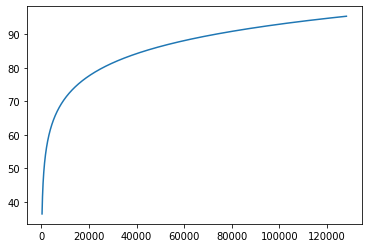

In [13]:
# Check that the curve conforms to what is expected

plt.plot(x_vals,y_vals)

In [34]:
df_3.columns

Index(['country_code', 'gdp_pcap', '2018 ranking', 'Country',
       'Social Progress Index', 'Basic Human Needs',
       'Foundations of Wellbeing', 'Opportunity'],
      dtype='object')

# 3 Gráfico interativo com Bokeh

In [58]:
source = ColumnDataSource(data=df_3)

tooltips = [('País','@Country'),('PIB per capita','@gdp_pcap{$ 0,0.00}'),('IPS','@{Social Progress Index}'),('IPS Ranking','@{2018 ranking}')]

In [59]:
fig = figure(tooltips=tooltips, toolbar_location='above', title='PIB per capita vs. IPS', x_axis_label='PIB per capita', y_axis_label='Índice de Progresso Social')

fig.circle(x='gdp_pcap', y='Social Progress Index', source=source)
fig.line(x_vals,y_vals, line_width=1.5, line_color='red',line_dash='solid',line_alpha=0.7)

show(fig)

# 4 Gráfico interativo com Plotly

In [60]:
hoverdata = {'Country':True,'gdp_pcap':':.2f','Social Progress Index':':.2f'}
hovertemplate = 'País:%{hovertext} <br>' + 'PIB per capita:%{x}<br>' + 'IPS:%{y}'

px_fig = go.Figure()

#px_fig = px.scatter(df_3, x='gdp_pcap', y='Social Progress Index',text='Country',hover_data=hoverdata)

px_fig.add_trace(go.Scatter(x=df_3.gdp_pcap, y=df_3['Social Progress Index'],hovertext=df_3['Country'], mode='markers'))

px_fig.update_traces(hovertemplate=hovertemplate)

px_fig.update_layout(uniformtext_mode='hide')

px_fig.add_trace(go.Scatter(x=x_vals, y=y_vals, mode='lines',line_color='red', opacity=0.3, showlegend=False))

#px_fig.remove_legend()

px_fig.show()

In [32]:
px_fig = go.Figure() 

px_fig.add_trace(go.Scatter(x=x_vals, y=y_vals, mode='lines',line_color='red', opacity=0.3, showlegend=False))

hovertemp = ["PIB per capita:%{df_3.gdp_pcap}"]

px_fig.add_trace(go.Scatter(customdata=df_3, x=df_3.gdp_pcap,y=df_3['Social Progress Index'], mode='markers', marker_color='#ffcc00', showlegend=False))

#px_fig.remove_legend()

px_fig.show()

ValueError: The first argument to the plotly.graph_objs.Scatter 
constructor must be a dict or 
an instance of :class:`plotly.graph_objs.Scatter`

## Making a Brazil GDP + SPI dataset

In [28]:
years = ['2019','2018','2017','2016','2015','2014']
dataframes = list()

for year in years:
    df = pd.read_excel('social_progress_index.xlsx', sheet_name=year)
    df = df[df.Country=='Brazil'][['Country',year+' ranking','Social Progress Index','Basic Human Needs','Foundations of Wellbeing','Opportunity']]
    df.rename(columns={year+' ranking':'Ranking'},inplace=True)
    dataframes.append(df)
    
df_merged = pd.concat(dataframes,axis=0)
df_merged.index = pd.to_datetime(years,format='%Y')

In [29]:
spi_dimensions = {'Opportunities':['Personal Rights','Personal Freedom and Choice','Inclusiveness','Access to Advanced Education']}
dataframes = list()

for year in years:
    df = pd.read_excel('social_progress_index.xlsx', sheet_name=year)
    df = df[df.Country=='Brazil'][['Country',year+' ranking'] + spi_dimensions['Opportunities']]
    df.rename(columns={year+' ranking':'Ranking'},inplace=True)
    dataframes.append(df)
    
df_merged = pd.concat(dataframes,axis=0)
df_merged.index = pd.to_datetime(years,format='%Y')
df_merged.to_excel('brazil_spi3.xlsx')

In [30]:
## Importando

url = 'http://api.worldbank.org/v2/country/bra/indicator/NY.GDP.PCAP.CD?date=2014:2019&format=json'
response =  requests.get(url)

## Check if response worked
response.status_code

200

In [31]:
brazil_gdp = pd.DataFrame(response.json()[1])
brazil_gdp.index = pd.to_datetime(brazil_gdp.date)
brazil_gdp.drop(columns=['indicator','country','countryiso3code','unit','obs_status','decimal','date'], inplace = True)

In [32]:
pd.merge(brazil_gdp,df_merged,left_index=True,right_index=True).to_excel('brazil_gdp_ips.xlsx')